## وارد کردن کتابخانه‌ها

<div style="font-family: Vazir, sans-serif; direction: rtl; text-align: right;">
<p>کتابخانه‌های مورد نیاز برای پردازش تصویر و نمایش نتایج:</p>
<ul>
    <li><b>cv2</b>: برای عملیات پردازش تصویر</li>
    <li><b>numpy</b>: برای کار با آرایه‌ها</li>
    <li><b>matplotlib.pyplot</b>: برای نمایش تصاویر و نمودارها</li>
</ul>
</div>


In [61]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

## تابع نمایش تصویر

<div style="font-family: Vazir, sans-serif; direction: rtl; text-align: right;">
<p>تابع <code>imshow</code> برای نمایش تصاویر با عنوان و اندازه دلخواه طراحی شده است. تصاویر رنگی به فرمت RGB تبدیل می‌شوند و تصاویر خاکستری با نقشه رنگی مناسب نمایش داده می‌شوند.</p>
</div>

In [62]:
def imshow(title='', image=None, size=8):
    if image is None:
        print("Error: Input image is None!")
        return
    
    w, h = image.shape[:2]
    plt.figure(figsize=(size * h / w, size))
    
    if len(image.shape) == 3:
        plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    else:
        plt.imshow(image, cmap='gray')
    
    plt.title(title, fontsize=12)
    plt.axis('off')
    plt.show()

<h1>AND, OR, NOT, XOR</h1>

## عملیات منطقی بیت‌به‌بیت

<div style="font-family: Vazir, sans-serif; direction: rtl; text-align: right;">
<p>عملیات بیت‌به‌بیت (AND، OR، NOT، XOR) برای ترکیب یا تغییر پیکسل‌های دو تصویر خاکستری استفاده می‌شوند. این عملیات برای پردازش‌هایی مانند ماسک‌گذاری یا ترکیب تصاویر مفید هستند.</p>
</div>

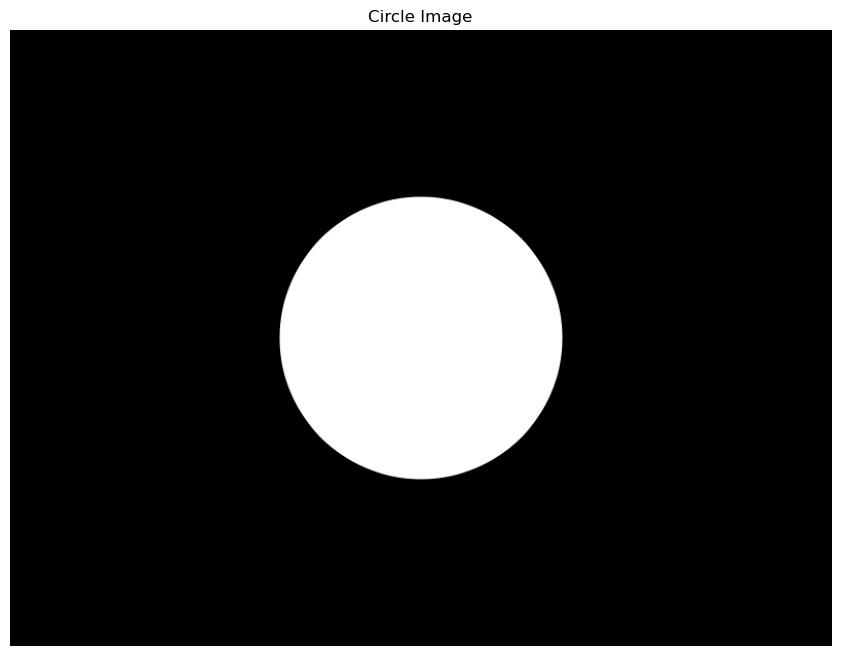

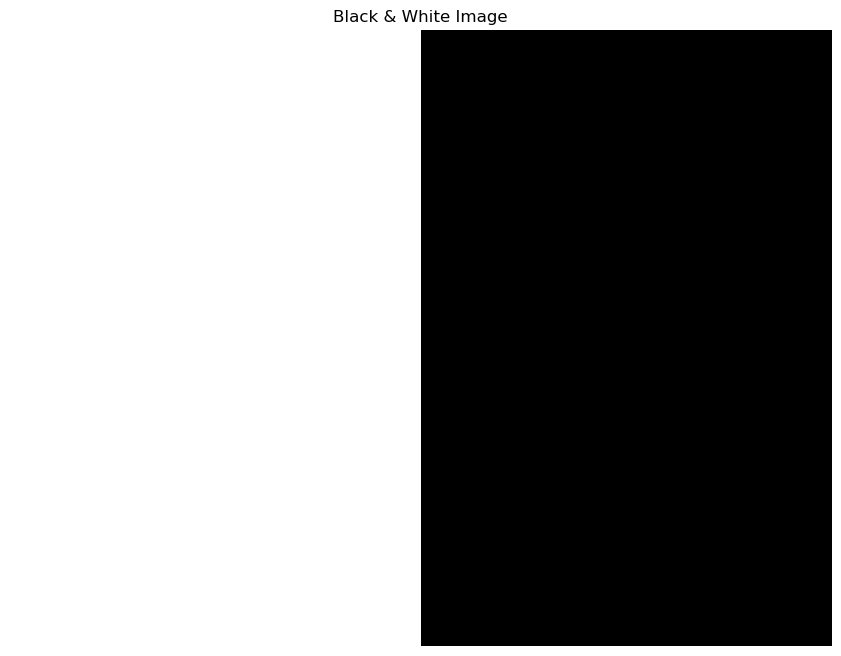

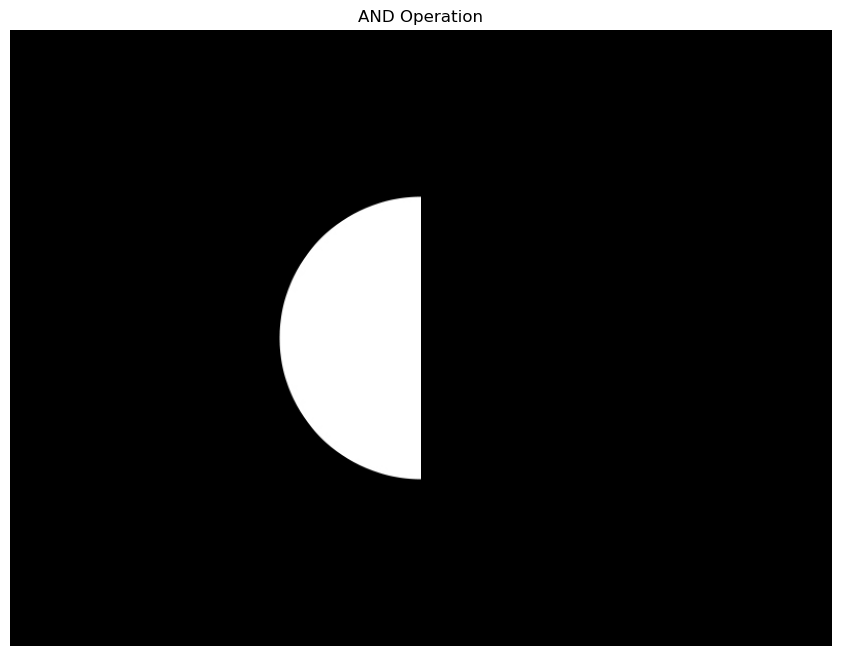

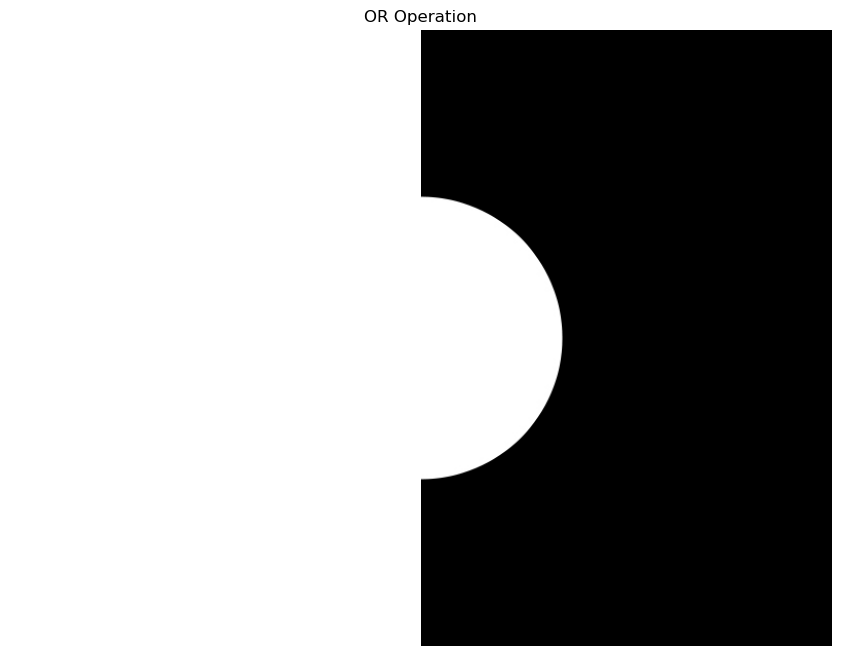

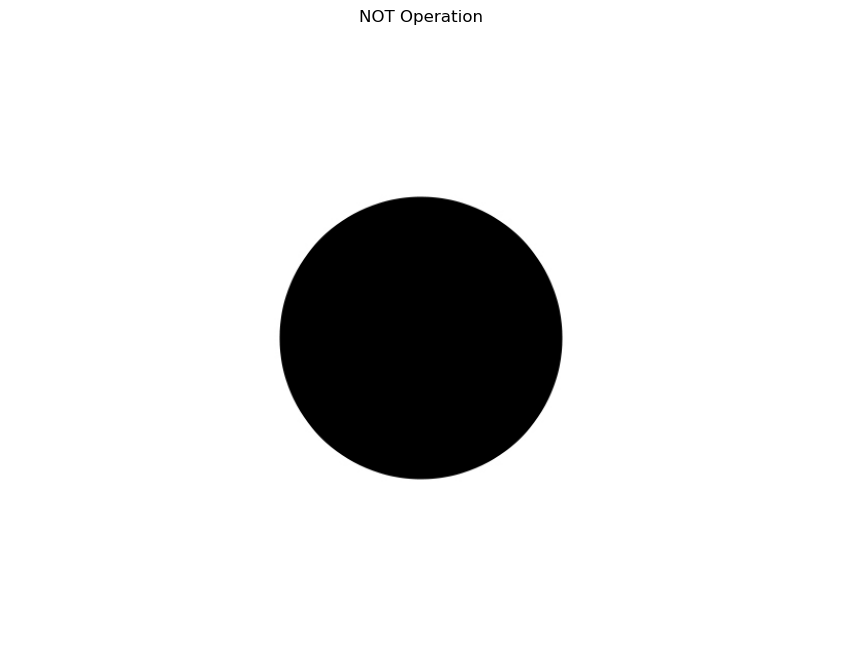

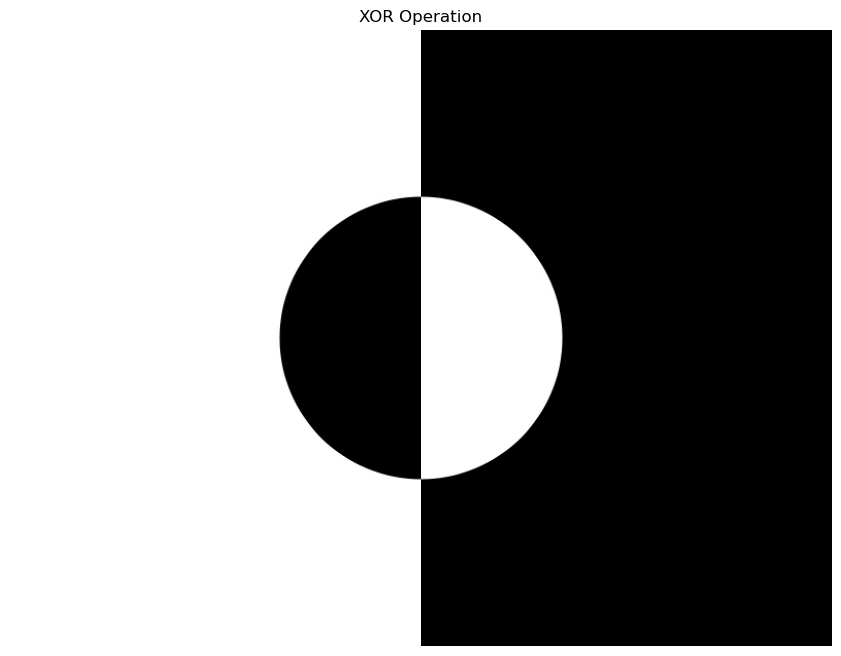

In [63]:
circle = cv.imread("circle.jpg", cv.IMREAD_GRAYSCALE)
bw = cv.imread("b&w.jpg", cv.IMREAD_GRAYSCALE)

if circle is None or bw is None:
    print("Error: Failed to load image!")
else:
    imshow("Circle Image", circle)
    imshow("Black & White Image", bw)
    
    imshow("AND Operation", cv.bitwise_and(circle, bw))
    imshow("OR Operation", cv.bitwise_or(circle, bw))
    imshow("NOT Operation", cv.bitwise_not(circle))
    imshow("XOR Operation", cv.bitwise_xor(circle, bw))

## ماسک‌گذاری تصویر

<div style="font-family: Vazir, sans-serif; direction: rtl; text-align: right;">
<p>ایجاد ماسک برای جدا کردن بخش‌هایی از تصویر بر اساس محدوده رنگی و اعمال ماسک معکوس برای تغییر پس‌زمینه تصویر. این تکنیک برای جداسازی اشیا یا تغییر پس‌زمینه کاربرد دارد.</p>
</div>


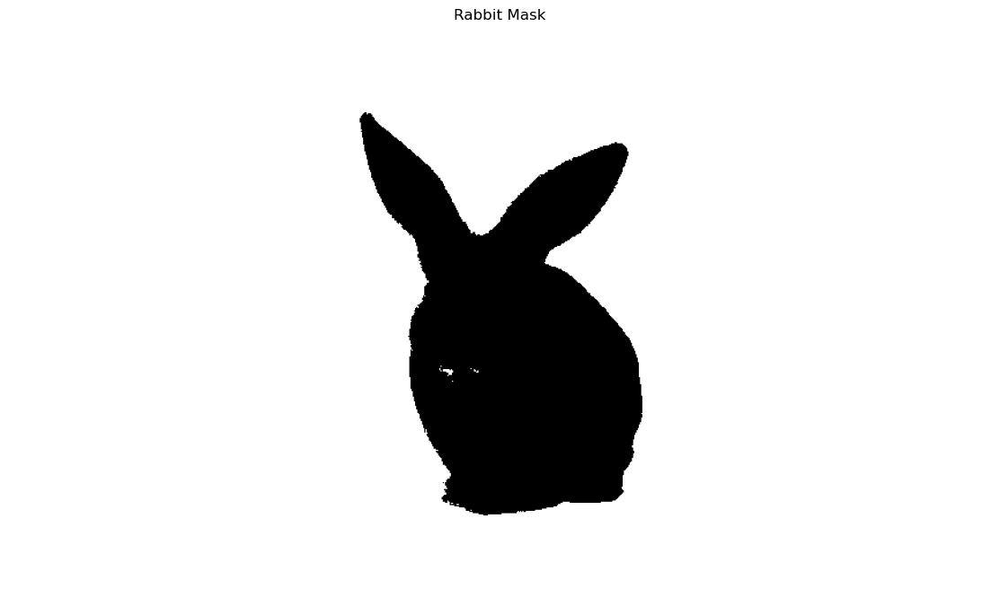

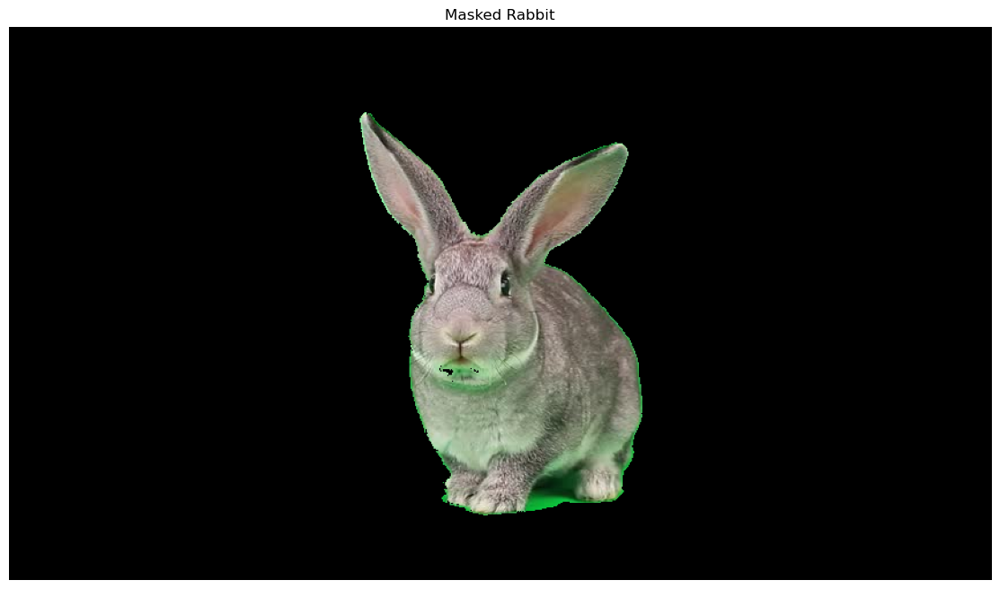

In [64]:
rabbit = cv.imread("Rabbit.png", cv.IMREAD_UNCHANGED)

if rabbit is None:
    print("Error: Failed to load rabbit image!")
else:
    lower_bound = np.array([0, 200, 0])
    upper_bound = np.array([150, 255, 150])
    mask = cv.inRange(rabbit, lower_bound, upper_bound)
    imshow("Rabbit Mask", mask)
    
    mask_inv = cv.bitwise_not(mask)
    rabbit_masked = cv.bitwise_and(rabbit, rabbit, mask=mask_inv)
    imshow("Masked Rabbit", rabbit_masked)


## آستانه‌گذاری

<div style="font-family: Vazir, sans-serif; direction: rtl; text-align: right;">
<p>آستانه‌گذاری برای جدا کردن نواحی روشن و تیره در تصویر با استفاده از دو روش: OTSU (خودکار) و تطبیقی (محلی). این روش‌ها برای تقسیم‌بندی تصویر کاربرد دارند.</p>
</div>

OTSU Threshold Value: 151.0


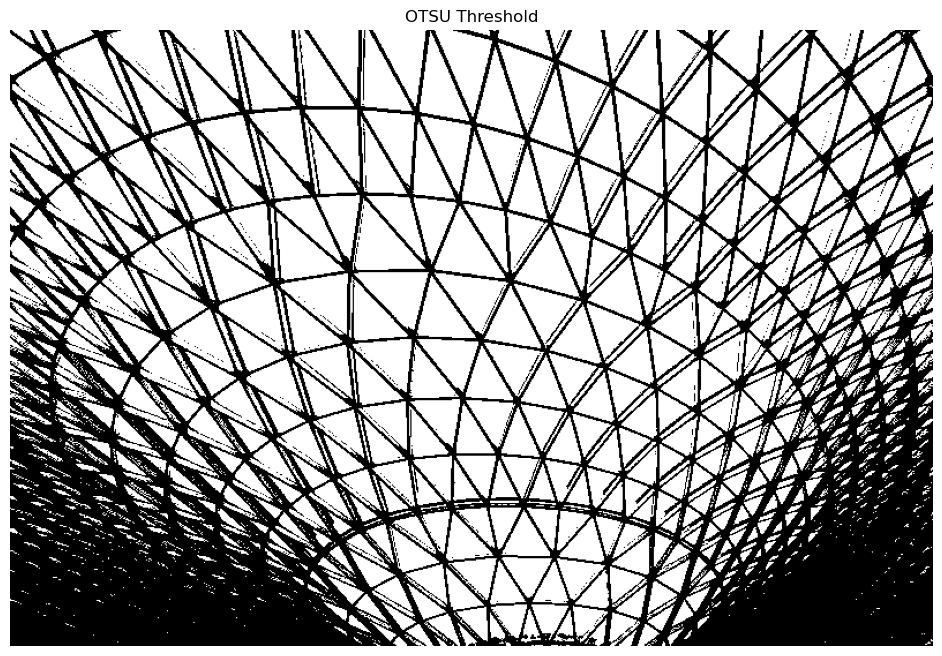

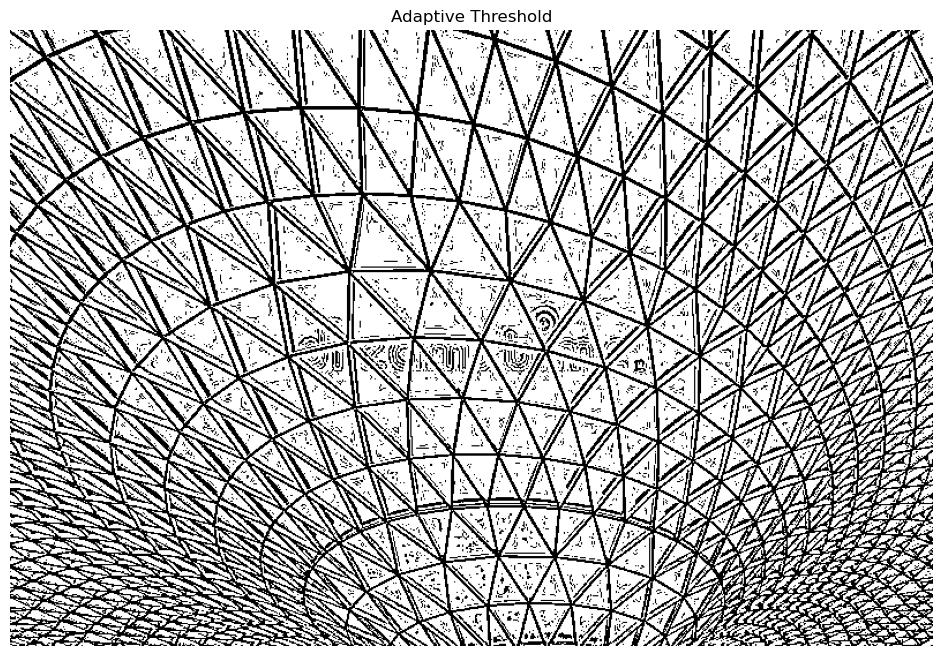

In [65]:
building = cv.imread("glass-steel-building-triangle-pattern-structure.jpg", cv.IMREAD_GRAYSCALE)

if building is None:
    print("Error: Failed to load building image!")
else:
    # OTSU Thresholding
    ret, thresh = cv.threshold(building, 0, 255, cv.THRESH_OTSU)
    print(f"OTSU Threshold Value: {ret}")
    imshow("OTSU Threshold", thresh)
    
    # Adaptive Thresholding
    adaptive = cv.adaptiveThreshold(building, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 11, 2)
    imshow("Adaptive Threshold", adaptive)

In [66]:
# threshold_img = cv.adaptiveThreshold(
#     building,                    # تصویر ورودی (باید سیاه‌سفید باشد)
#     255,                         # مقدار بیشینه برای نواحی آستانه‌گذاری‌شده
#     cv.ADAPTIVE_THRESH_GAUSSIAN_C,  # روش محاسبه مقدار آستانه (می‌تواند MEAN_C یا GAUSSIAN_C باشد)
#     cv.THRESH_BINARY,           # نوع آستانه‌گذاری (معمولاً THRESH_BINARY یا THRESH_BINARY_INV)
#     3,                          # اندازه بلوک (باید فرد باشد، مثل 11 یا 15)
#     9                            # مقدار C که از میانگین کم می‌شود
# )
# imshow("threshold_img",threshold_img)

<h1>Image shifting</h1>


## جابجایی و چرخش تصویر

<div style="font-family: Vazir, sans-serif; direction: rtl; text-align: right;">
<p>جابجایی تصویر با ماتریس تبدیل و چرخش تصویر با استفاده از ماتریس چرخش. این تکنیک‌ها برای تغییر مکان یا جهت تصویر استفاده می‌شوند.</p>
</div>


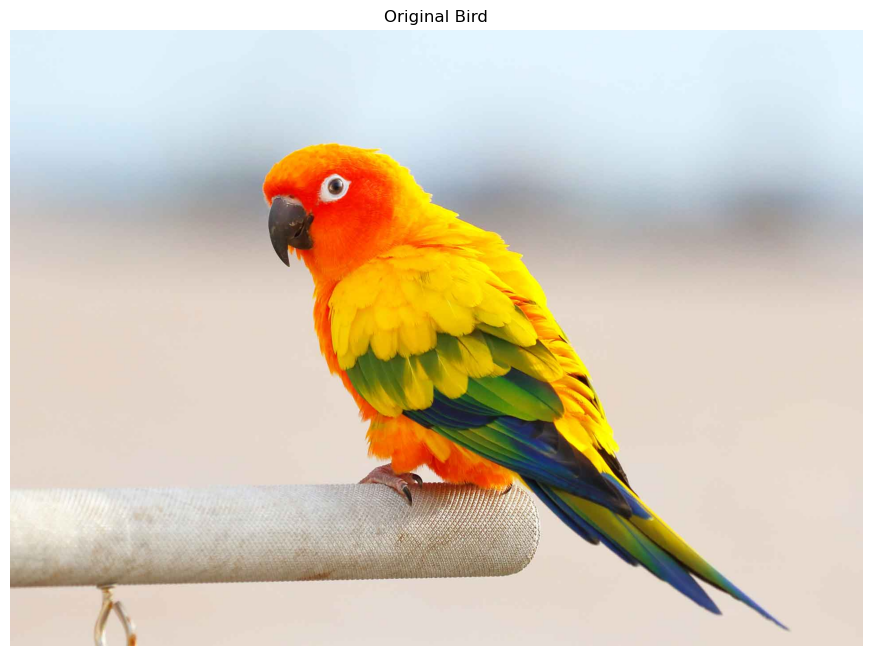

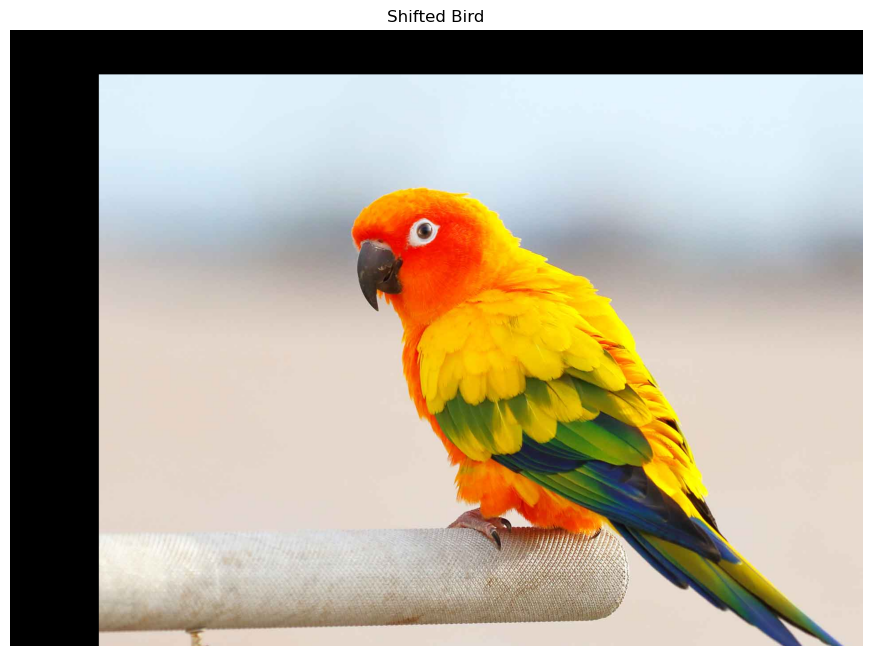

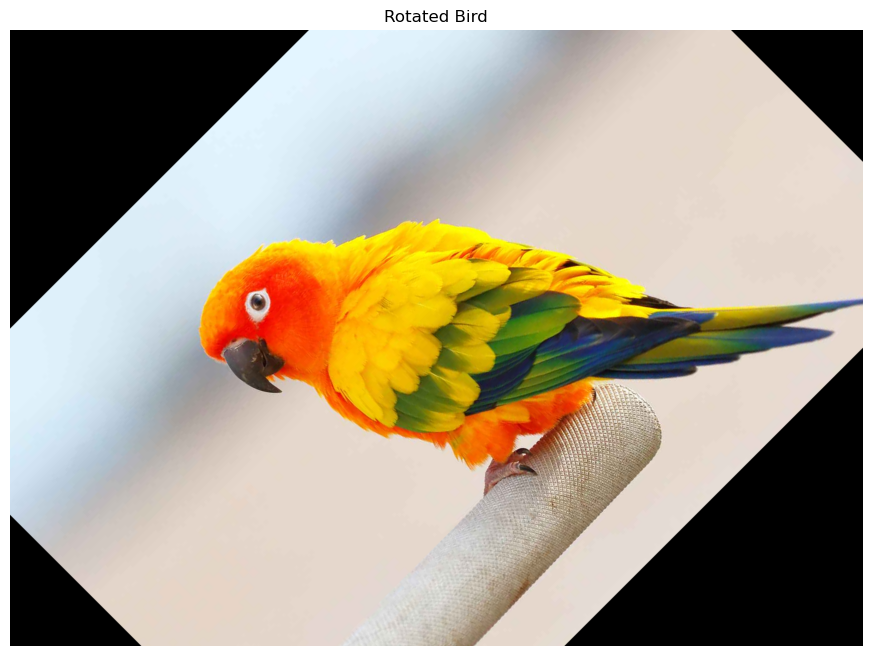

In [67]:
bird = cv.imread("bird.jpeg", cv.IMREAD_UNCHANGED)

if bird is None:
    print("Error: Failed to load bird image!")
else:
    imshow("Original Bird", bird)
    
    # Image Shifting
    mat_shift = np.float32([[1, 0, 200], [0, 1, 100]])
    bird_shifted = cv.warpAffine(bird, mat_shift, (bird.shape[1], bird.shape[0]))
    imshow("Shifted Bird", bird_shifted)
    
    # Image Rotation
    h, w = bird.shape[:2]
    center = (w // 2, h // 2)
    mat_rotate = cv.getRotationMatrix2D(center, 45, 1.0)
    bird_rotated = cv.warpAffine(bird, mat_rotate, (w, h))
    imshow("Rotated Bird", bird_rotated)

## هیستوگرام و تعادل‌سازی

<div style="font-family: Vazir, sans-serif; direction: rtl; text-align: right;">
<p>محاسبه هیستوگرام تصویر خاکستری برای نمایش توزیع شدت پیکسل‌ها و تعادل‌سازی هیستوگرام برای بهبود کنتراست تصویر.</p>
</div>


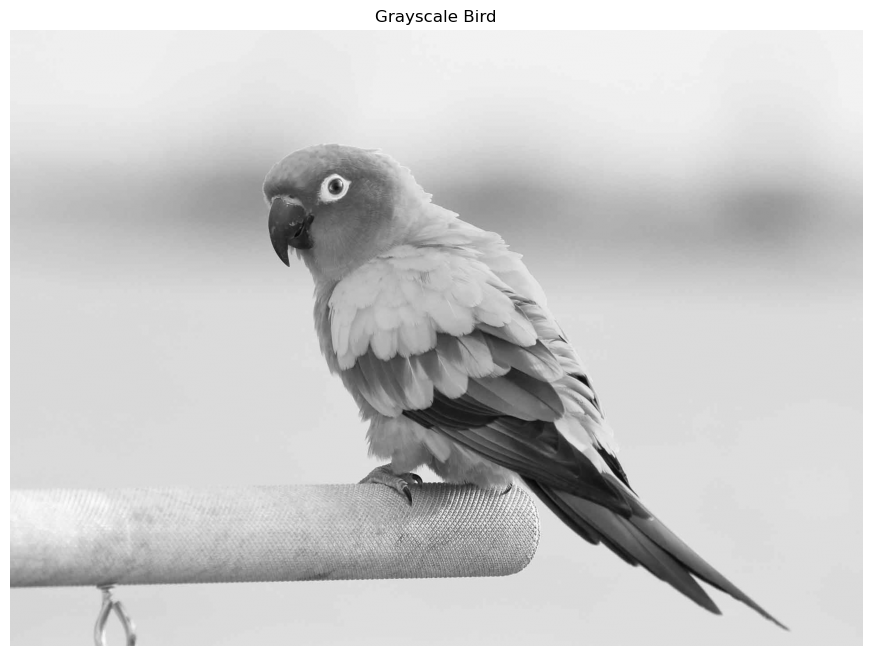

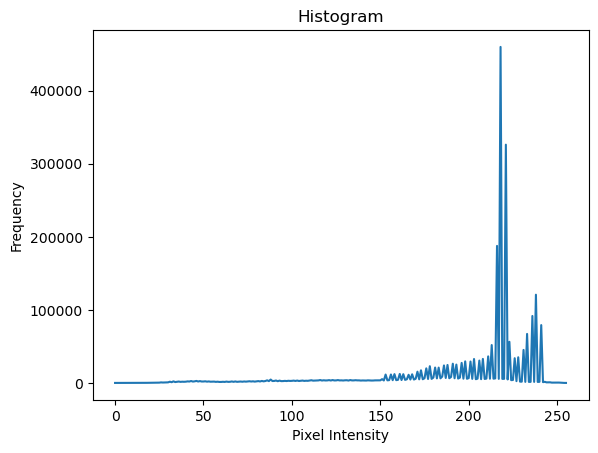

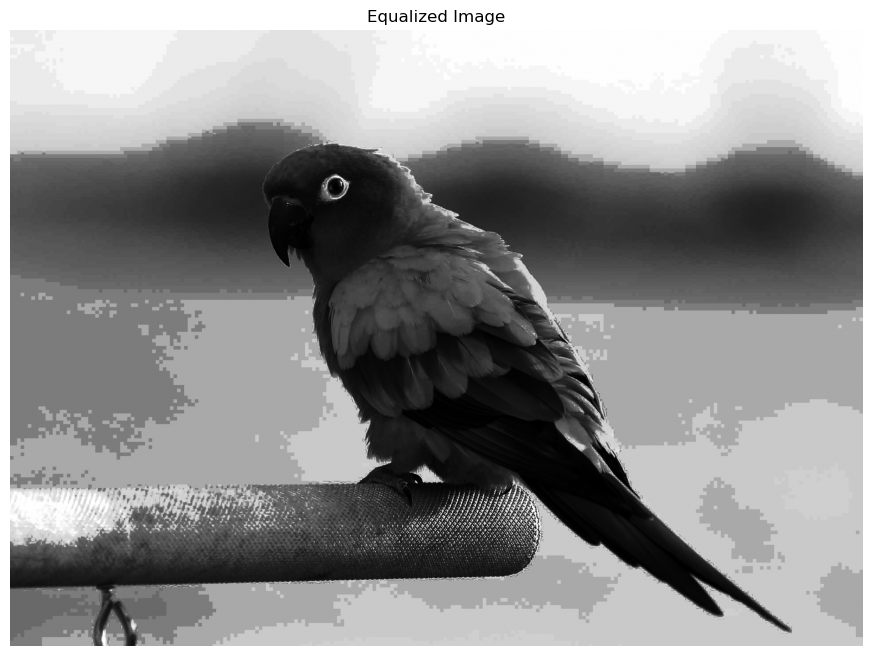

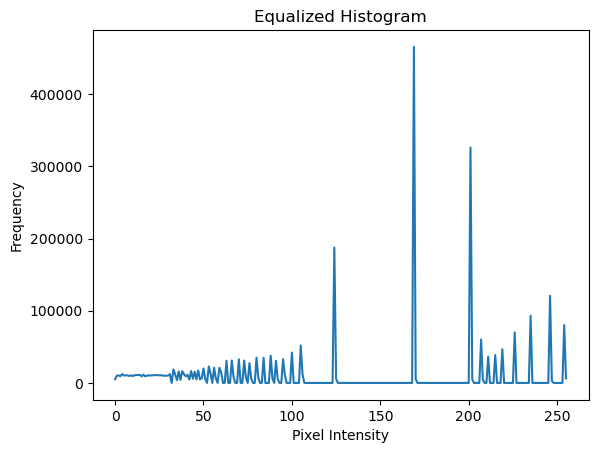

In [68]:
if bird is None:
    print("Error: Failed to load bird image!")
else:
    bird_gray = cv.cvtColor(bird, cv.COLOR_BGR2GRAY)
    imshow("Grayscale Bird", bird_gray)
    
    hist = cv.calcHist([bird_gray], [0], None, [256], [0, 256])
    plt.plot(hist)
    plt.title("Histogram")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.show()
    
    equalized = cv.equalizeHist(bird_gray)
    imshow("Equalized Image", equalized)
    
    hist_eq = cv.calcHist([equalized], [0], None, [256], [0, 256])
    plt.plot(hist_eq)
    plt.title("Equalized Histogram")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.show()

<h1>Bluring</h1>
## فیلترهای محو کردن

<div style="font-family: Vazir, sans-serif; direction: rtl; text-align: right;">
<p>اعمال فیلترهای محو کردن شامل میانگین، گاوسی، میانه، و دوطرفه برای کاهش نویز یا ایجاد افکت‌های بصری.</p>
</div>

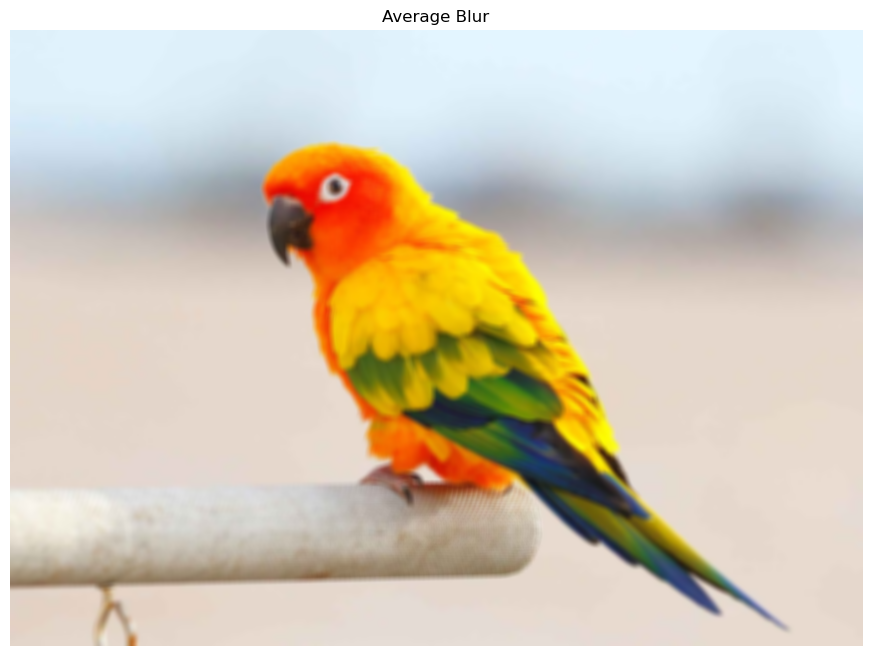

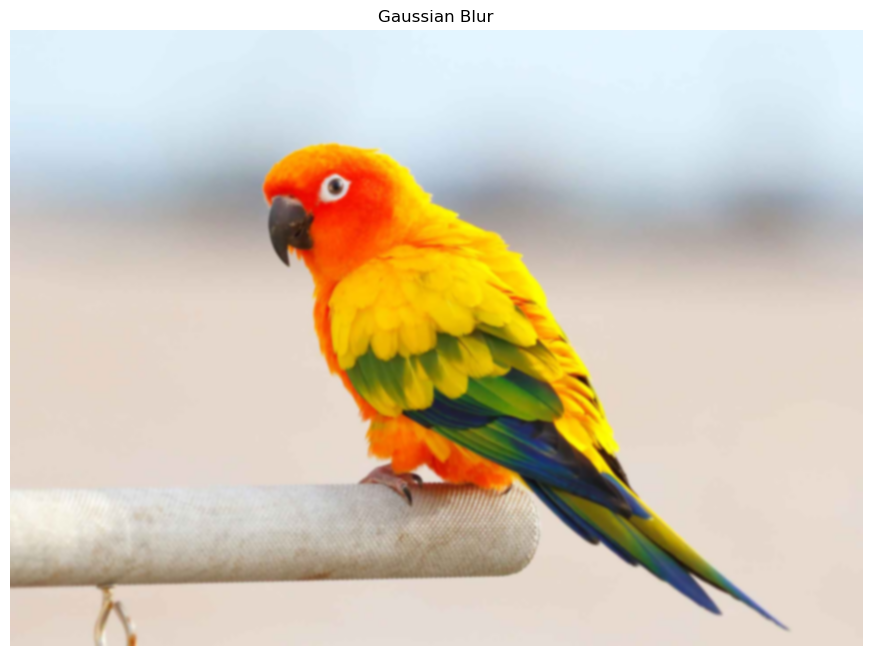

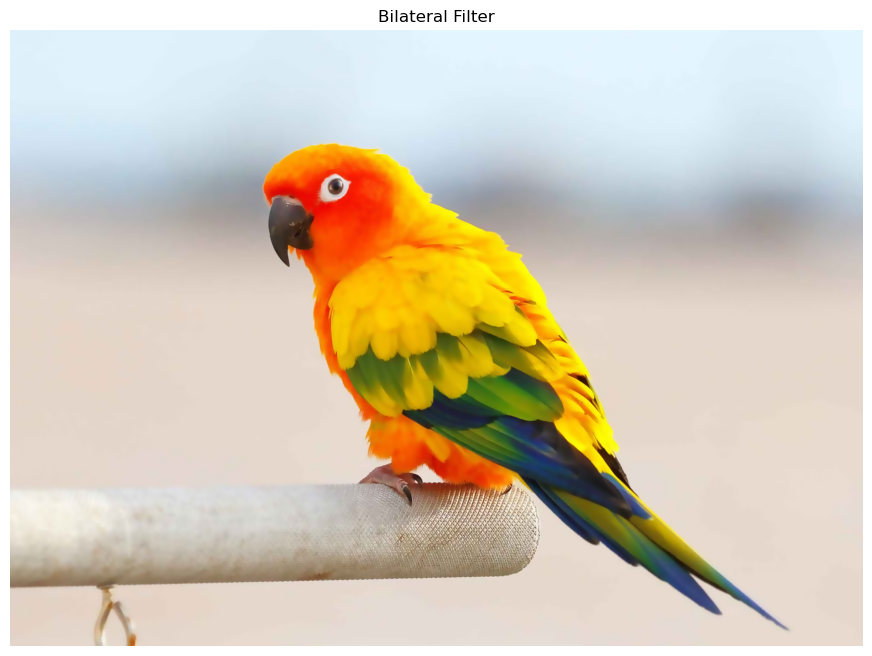

In [69]:
 # Average Blur
avg_blur = cv.blur(bird, (15, 15))
imshow("Average Blur", avg_blur)

# Gaussian Blur
gaussian_blur = cv.GaussianBlur(bird, (15, 15), 0)
imshow("Gaussian Blur", gaussian_blur)

# Bilateral Filter
bilateral = cv.bilateralFilter(bird, 15, 50, 50)
imshow("Bilateral Filter", bilateral)

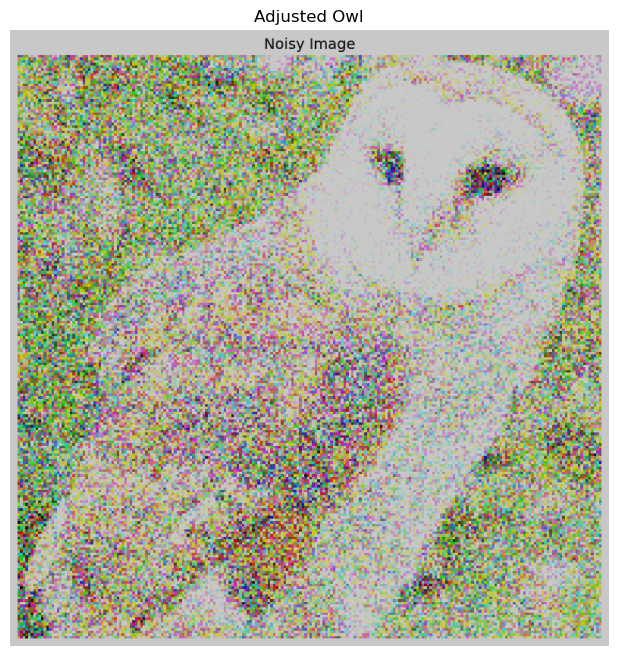

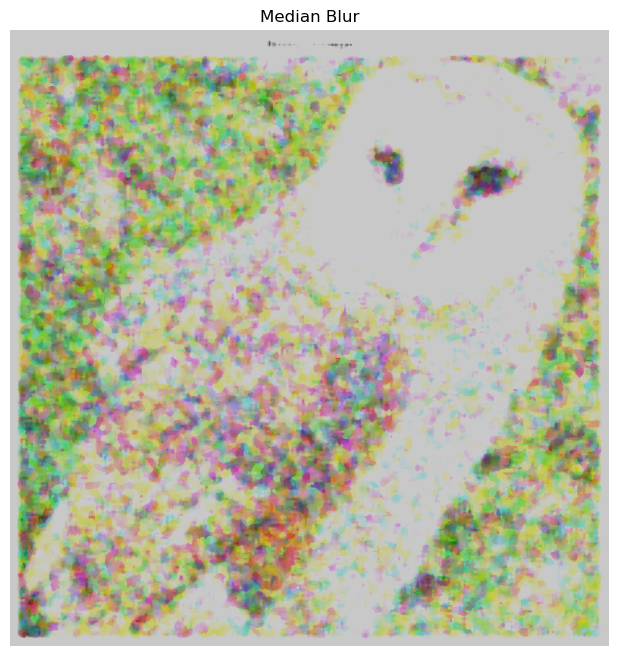

In [70]:
owl = cv.imread("owl_noisy.jpeg", cv.IMREAD_UNCHANGED)
if owl is None:
    print("Error: Failed to load owl image!")
else:
    owl = cv.convertScaleAbs(owl, alpha=0.9, beta=-30)
    imshow("Adjusted Owl", owl)
    
    # Median Blur
    median_blur = cv.medianBlur(owl, 11)
    imshow("Median Blur", median_blur)

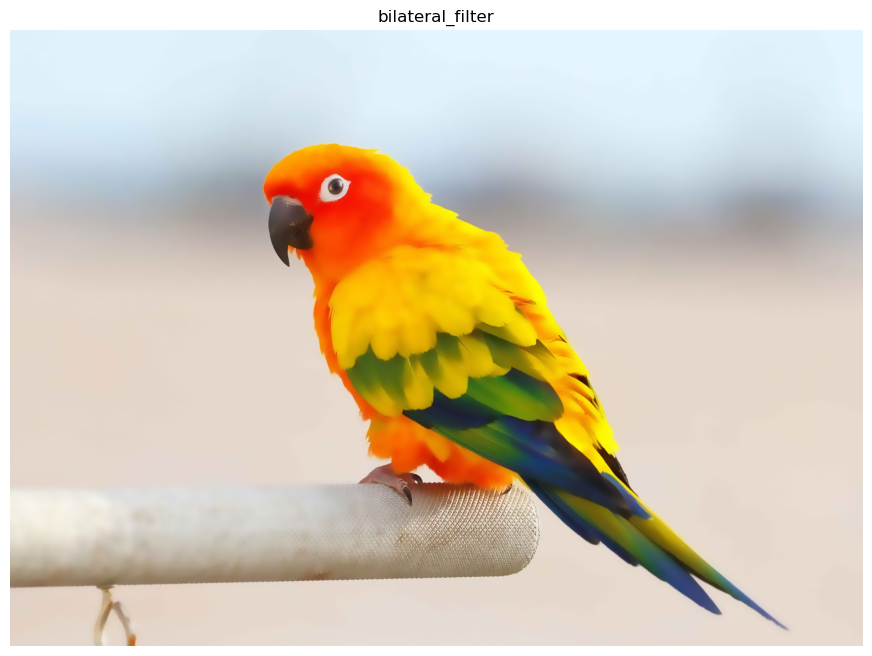

In [71]:
bilateral_filter = cv.bilateralFilter(bird,25,75,75)
imshow("bilateral_filter", bilateral_filter)


## محو کردن حرکتی

<div style="font-family: Vazir, sans-serif; direction: rtl; text-align: right;">
<p>ایجاد افکت محو کردن حرکتی با کرنل‌های افقی و عمودی برای شبیه‌سازی حرکت دوربین یا سوژه.</p>
</div>


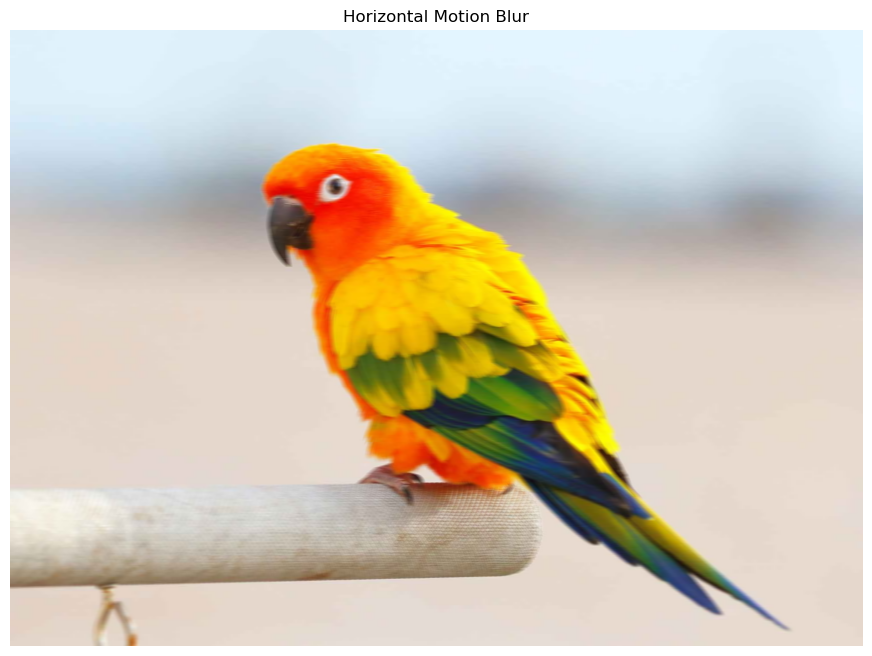

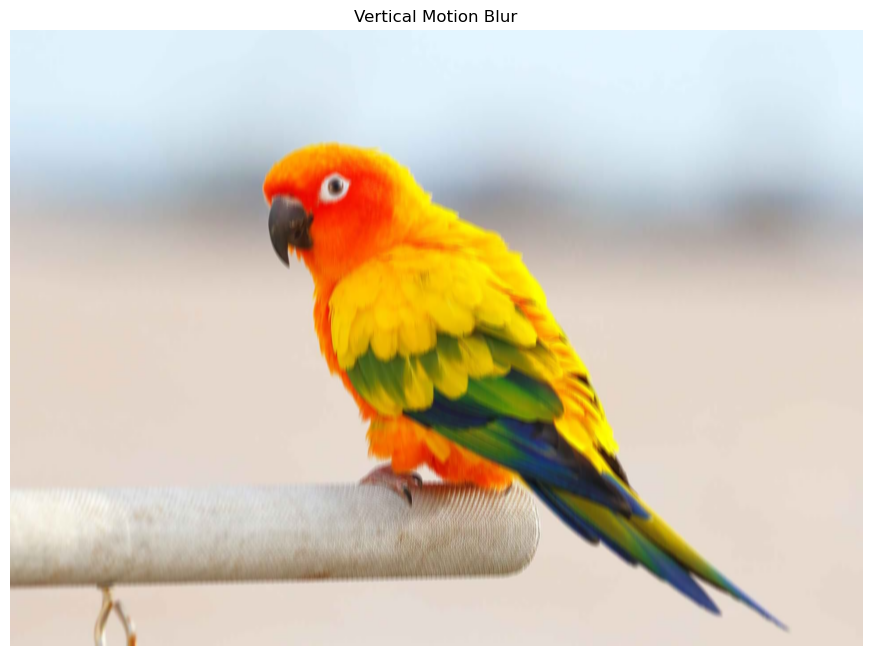

In [72]:
size = 15
kernel_h = np.zeros((size, size))
kernel_h[int(size / 2), :] = np.ones(size) / size
motion_h = cv.filter2D(bird, -1, kernel_h)
imshow("Horizontal Motion Blur", motion_h)

kernel_v = np.zeros((size, size))
kernel_v[:, int(size / 2)] = np.ones(size) / size
motion_v = cv.filter2D(bird, -1, kernel_v)
imshow("Vertical Motion Blur", motion_v)


## تشخیص لبه‌ها

<div style="font-family: Vazir, sans-serif; direction: rtl; text-align: right;">
<p>استخراج لبه‌های تصویر با استفاده از فیلتر لاپلاسین و Canny. این روش‌ها تغییرات شدت پیکسل‌ها را برجسته می‌کنند.</p>
</div>


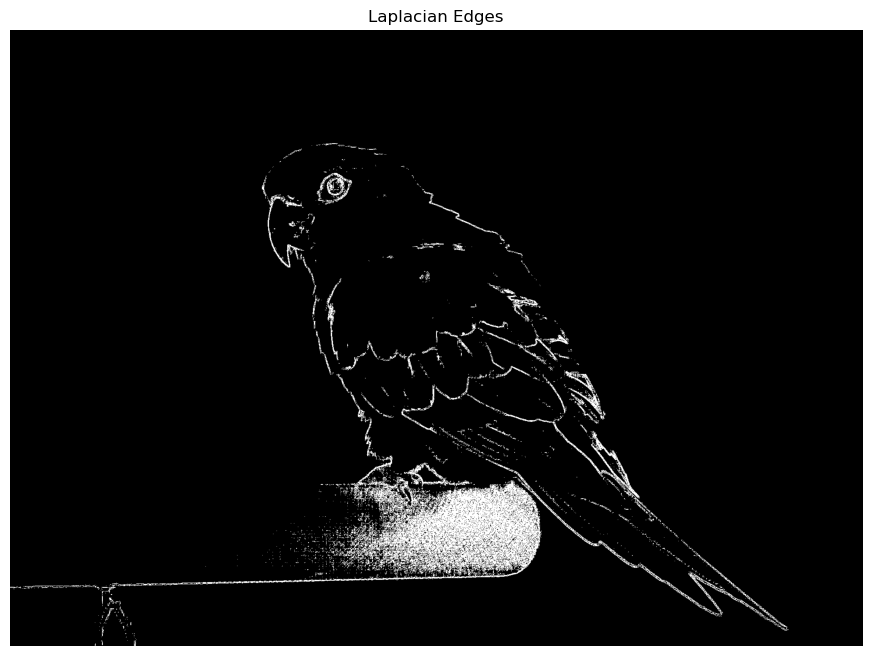

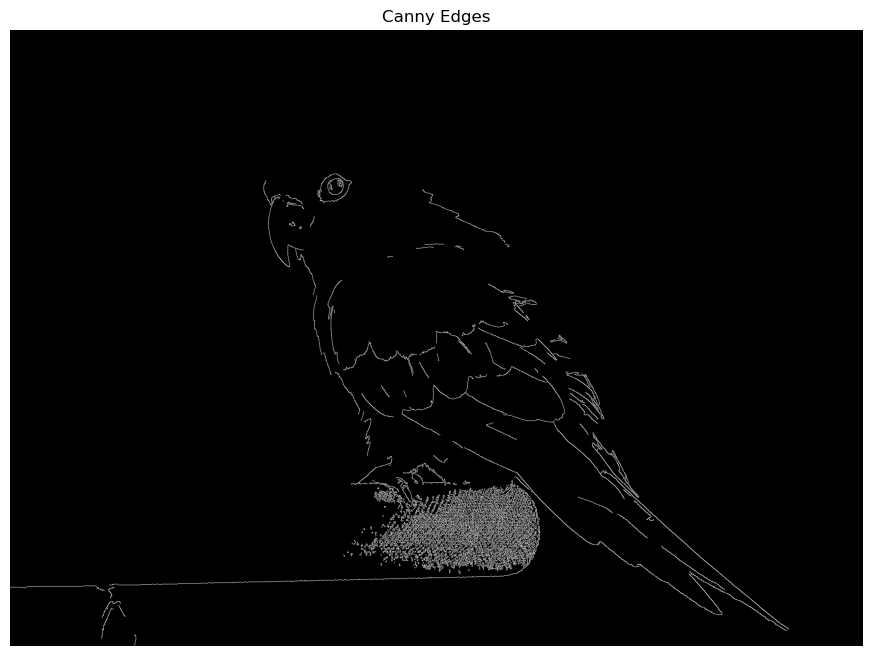

In [73]:
gray = cv.cvtColor(bilateral, cv.COLOR_BGR2GRAY)

# Laplacian Edge Detection
lap_kernel = np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]], dtype=np.float32)
laplacian = cv.filter2D(gray, cv.CV_64F, lap_kernel)
laplacian_abs = cv.convertScaleAbs(laplacian)
_, edges_lap = cv.threshold(laplacian_abs, 30, 255, cv.THRESH_BINARY)
imshow("Laplacian Edges", edges_lap)

# Canny Edge Detection
edges_canny = cv.Canny(gray, 100, 200)
imshow("Canny Edges", edges_canny)


## فیلترهای گرادیان (Sobel)

<div style="font-family: Vazir, sans-serif; direction: rtl; text-align: right;">
<p>استفاده از فیلتر Sobel برای تشخیص گرادیان‌های افقی و عمودی در تصویر. این فیلترها برای شناسایی لبه‌ها و جهت‌گیری آن‌ها مفید هستند.</p>
</div>

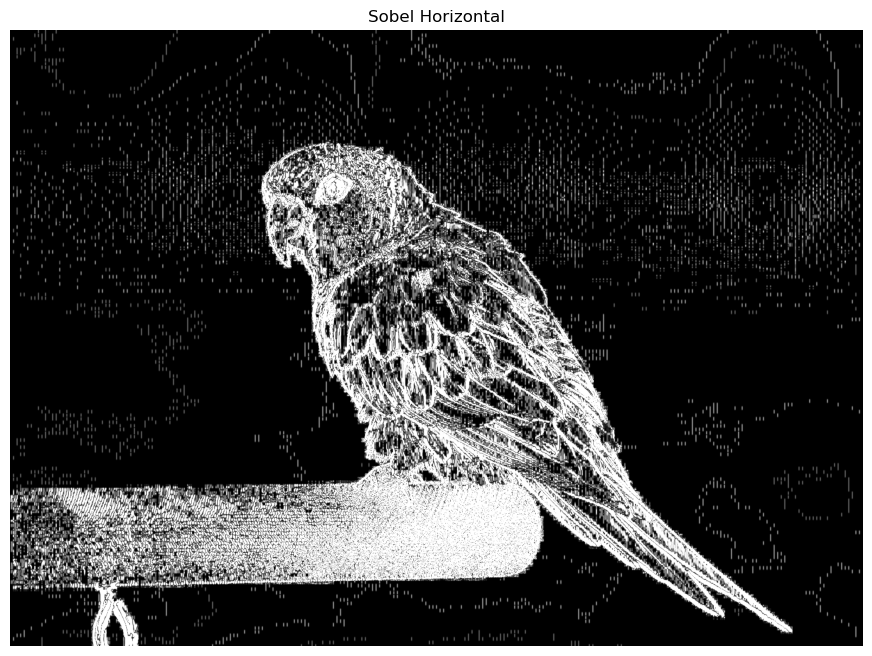

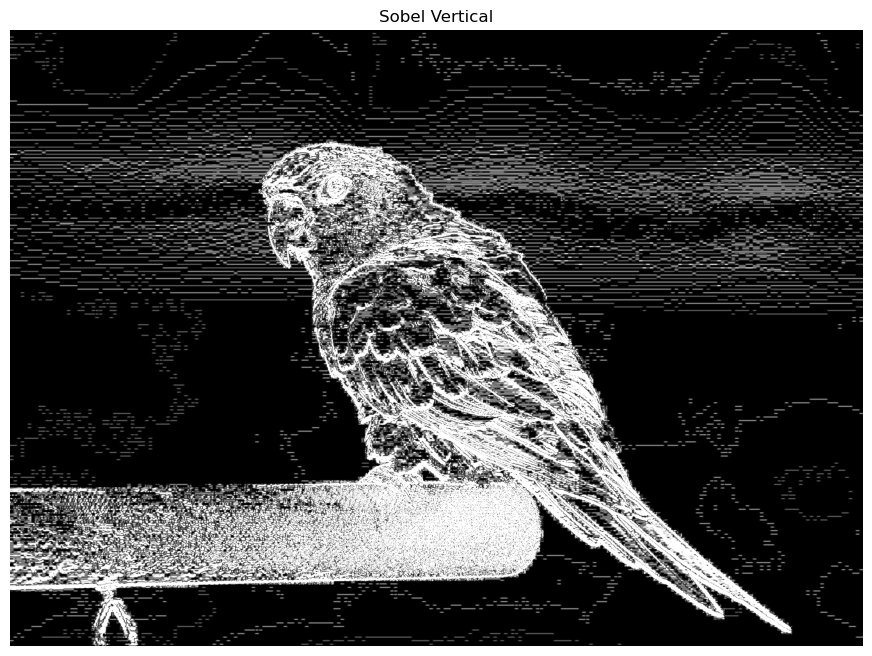

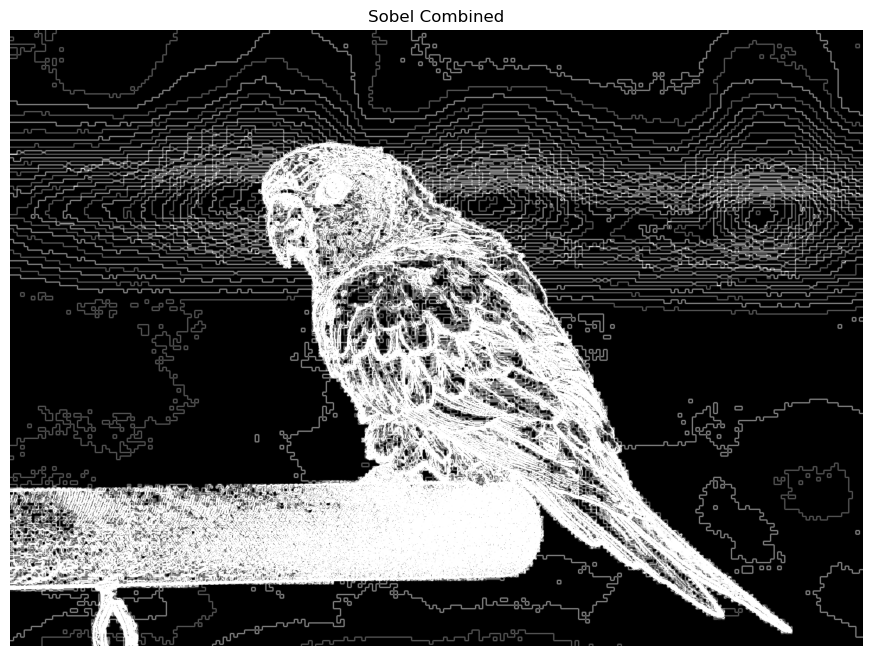

In [74]:
gray = cv.cvtColor(bird, cv.COLOR_BGR2GRAY)

# Sobel Filter (Horizontal)
sobel_x = cv.Sobel(gray, cv.CV_64F, 1, 0, ksize=5)
sobel_x_abs = cv.convertScaleAbs(sobel_x)
imshow("Sobel Horizontal", sobel_x_abs)

# Sobel Filter (Vertical)
sobel_y = cv.Sobel(gray, cv.CV_64F, 0, 1, ksize=5)
sobel_y_abs = cv.convertScaleAbs(sobel_y)
imshow("Sobel Vertical", sobel_y_abs)

# Combined Sobel
sobel_combined = cv.bitwise_or(sobel_x_abs, sobel_y_abs)
imshow("Sobel Combined", sobel_combined)